# Apply Bi-LSTM with Attenstion on Realizing High Throughput Binding Assay Dataset with RNA Structure in Tensorflow 2
Original pytorch implement: https://github.com/graykode/nlp-tutorial
## Import packages

In [29]:
import pandas as pd
import tensorflow as tf
from tensorflow.keras import layers
import numpy as np
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler, Normalizer, KBinsDiscretizer
from sklearn.pipeline import Pipeline, make_pipeline

## Data Preparation
### Import data

In [3]:
df = pd.read_csv("Result_Structure.csv")
df.head()

,Sequence,Structure,MFE,K,KA,RKA,Qc,sevenMer
0,GGAUCCAUUCAAAAAAAGAACGGAUCC,((((((.(((.......))).)))))),-10.5,4.971544,0.201145,0.395847,0,AAAAAAA
1,GGAUCCAUUCAAAAAACGAACGGAUCC,((((((.(((.......))).)))))),-10.5,4.514383,0.221514,0.435934,0,AAAAAAC
2,GGAUCCAUUCAAAAAAGGAACGGAUCC,((((((.(((.......))).)))))),-10.4,3.609146,0.277074,0.545273,0,AAAAAAG
3,GGAUCCAUUCAAAAAAUGAACGGAUCC,((((((.((((.....)))).)))))),-11.7,6.607685,0.151339,0.297831,0,AAAAAAU
4,GGAUCCAUUCAAAAACAGAACGGAUCC,((((((.(((.......))).)))))),-10.5,3.221327,0.310431,0.610919,0,AAAAACA


### Set a function to cut the sequence per nucleotide.

In [4]:
def cutWord(x, window=1, length = 27):
    seq2word = []
    for i in range(length):
        seq2word.append(x[i*window:i*window+window])
    return " ".join(seq2word)

def RKA_bin(x):
    if x >= 0.8:
        return(1)
    else:
        return(0)

def MFE_bin(x):
    if x >= -14.:
        return(1)
    else:
        return(0)

In [5]:
df["RKA_level"] = df.RKA.apply(RKA_bin)
df["MFE_level"] = df.RKA.apply(RKA_bin)
target = df[["MFE_level","RKA_level"]].copy()
sequences = df[["Sequence"]].copy()
seq_spaced = sequences.applymap(cutWord)

#Divide to train and test
X_train, X_test, y_train, y_test = train_test_split(seq_spaced, target, test_size=0.33, random_state=42)

### Convert pandas dataframes to tensorflow dataset

In [6]:
#Training data
data_train = tf.data.Dataset.from_tensor_slices((X_train, y_train))
data_test = tf.data.Dataset.from_tensor_slices((X_test, y_test))

2022-01-12 12:17:05.046229: I tensorflow/core/platform/cpu_feature_guard.cc:151] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.


## Model Preparation

### Set text vectorization and embedding layers

In [30]:
# Parameters
vocab_length = 27
embedding_dim = 2
num_classes = 2
n_hidden = 5
EPOCHS = 3

#Text vectorize
sequence_database = tf.data.Dataset.from_tensor_slices(X_train)
vectorize_layer = tf.keras.layers.TextVectorization(max_tokens=5, output_mode='int', output_sequence_length=27, name ='vectorize_layer')
vectorize_layer.adapt(seq_spaced)

#Embedding layer
embedding = layers.Embedding(input_dim=vocab_length, output_dim=embedding_dim, name = 'embedding_layer')

#Bi-LSTM for weights
forward_layer = layers.LSTM(n_hidden, return_sequences=True, return_state = True)
backward_layer = layers.LSTM(n_hidden, activation='relu', return_sequences=True, go_backwards=True, return_state = True)
lstm = layers.Bidirectional(forward_layer, backward_layer=backward_layer, input_shape=(27, embedding_dim))

### Create Model

In [31]:
def model_gen():
    input = tf.keras.Input(shape=(1,), dtype='string')
    x = vectorize_layer(input)
    x = embedding(x) # input : [batch_size, len_seq, embedding_dim]

    # Generate the weight for attnetion
    lstm_x = lstm(x)
    x = lstm_x[0] #Shape = [None,27,n_hidden]
    h0 = lstm_x[1]
    #Extract weight for LSTM
    h0 = layers.Concatenate(axis = 1)([h0,h0]) #Shape [None, 2*n_hidden]
    h0 = layers.Reshape(target_shape=(2*n_hidden,1))(h0) #shape [None, 2*n_hidden, 1]
    #h0 : [batch_size, n_hidden * num_directions(=2), 1(=n_layer)]

    #Make attention weights
    attn_weights = tf.matmul(x, h0) #shape = [None,27,1]
    soft_attn_weights = tf.keras.activations.softmax(attn_weights, -1) #shape = [None, 27, 1]

    #Generate result after attention
    x = layers.Permute(dims=(2,1))(x) #shape = [None, 2*n_hodden, 27]
    context = tf.matmul(x, soft_attn_weights) #Shape = [None, n_hidden * num_directions(=2), 1]

    context = layers.Permute(dims=(2,1))(context) #context : [batch_size, 1, n_hidden * num_directions(=2)]
    output = layers.Dense(num_classes)(context)
    output = output
    return tf.keras.Model(inputs = input, outputs = output)

model = model_gen()

In [ ]:
model=model_gen()
model.compile(optimizer='adam',
              loss=tf.keras.losses.BinaryCrossentropy(),
              metrics=['accuracy'])

#Set up tensorboard callback function
tensorboard_callback = tf.keras.callbacks.TensorBoard('./logs', update_freq=1)

In [14]:
model.fit(
    data_train,
    validation_data=data_test,
    epochs=EPOCHES,
    callbacks=[tensorboard_callback]
    )


Epoch 1/3
10977/10977 [==============================] - 79s 7ms/step - loss: 1.9785 - accuracy: 0.8717 - val_loss: 1.9998 - val_accuracy: 0.8704
Epoch 2/3
10977/10977 [==============================] - 82s 7ms/step - loss: 1.9785 - accuracy: 0.8717 - val_loss: 1.9998 - val_accuracy: 0.8704
Epoch 3/3
10977/10977 [==============================] - 75s 7ms/step - loss: 1.9785 - accuracy: 0.8717 - val_loss: 1.9998 - val_accuracy: 0.8704


### Extract layers from model

In [15]:
model.summary()
layer1 = model.get_layer('vectorize_layer')
layer2 = model.get_layer('embedding_layer')

Model: "model_1"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_2 (InputLayer)           [(None, 1)]          0           []                               
                                                                                                  
 vectorize_layer (TextVectoriza  (None, 27)          0           ['input_2[0][0]']                
 tion)                                                                                            
                                                                                                  
 embedding_layer (Embedding)    (None, 27, 2)        54          ['vectorize_layer[1][0]']        
                                                                                                  
 bidirectional (Bidirectional)  [(None, 27, 10),     320         ['embedding_layer[1][0]']  

### Convert every RNA sequence into a 2D space

In [16]:
#Embedding
final_result = layer1(seq_spaced)
final_result = layer2(final_result)
final_result = final_result.numpy()

#Convert tensorflow result to pandas DataFrame
df_cp = df.copy()
for i in range(27):
    for j in range(2):
        df_cp["L"+str(i+1)+str(j+1)] = final_result[:,i,j]

df_cp.head()



,Sequence,Structure,MFE,K,KA,RKA,Qc,sevenMer,RKA_level,MFE_level,...,L231,L232,L241,L242,L251,L252,L261,L262,L271,L272
0,GGAUCCAUUCAAAAAAAGAACGGAUCC,((((((.(((.......))).)))))),-10.5,4.971544,0.201145,0.395847,0,AAAAAAA,0,0,...,0.032156,-0.040179,0.066619,-0.022964,-0.044202,0.102996,-0.016708,0.065301,-0.016708,0.065301
1,GGAUCCAUUCAAAAAACGAACGGAUCC,((((((.(((.......))).)))))),-10.5,4.514383,0.221514,0.435934,0,AAAAAAC,0,0,...,0.032156,-0.040179,0.066619,-0.022964,-0.044202,0.102996,-0.016708,0.065301,-0.016708,0.065301
2,GGAUCCAUUCAAAAAAGGAACGGAUCC,((((((.(((.......))).)))))),-10.4,3.609146,0.277074,0.545273,0,AAAAAAG,0,0,...,0.032156,-0.040179,0.066619,-0.022964,-0.044202,0.102996,-0.016708,0.065301,-0.016708,0.065301
3,GGAUCCAUUCAAAAAAUGAACGGAUCC,((((((.((((.....)))).)))))),-11.7,6.607685,0.151339,0.297831,0,AAAAAAU,0,0,...,0.032156,-0.040179,0.066619,-0.022964,-0.044202,0.102996,-0.016708,0.065301,-0.016708,0.065301
4,GGAUCCAUUCAAAAACAGAACGGAUCC,((((((.(((.......))).)))))),-10.5,3.221327,0.310431,0.610919,0,AAAAACA,0,0,...,0.032156,-0.040179,0.066619,-0.022964,-0.044202,0.102996,-0.016708,0.065301,-0.016708,0.065301


## Data Visualozation by plotly
### 3D plot with 8th and 9th two nucleotides with relative binding ability (Relative association constant) 

In [80]:
import plotly.express as px
df = df_cp
fig = px.scatter_3d(df, x='L111', y='L161', z='RKA', color='MFE',
                   custom_data=['sevenMer', 'RKA', 'MFE'])
#set hover
fig.update_traces(
    hovertemplate = "<br>".join([
    "Seq: %{customdata[0]}",
    "RKA: %{customdata[1]}",
    "MFE: %{customdata[2]}"])
)

fig.show()

### Use seaborn to show the 11th nucleotide and binding ability

<AxesSubplot:xlabel='L171', ylabel='RKA'>

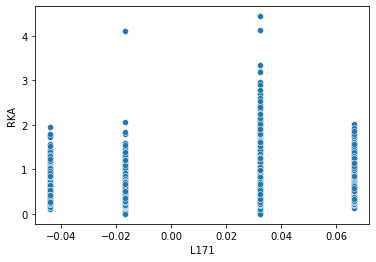

In [37]:
sns.scatterplot(data=df_cp, x='L171', y='RKA')

## Apply t-SNE to visualize the groups

### Implement t-SNE by sklearn
Here to set t-SNE, the parameter, perplexity, is very critical and is recommended in range of 5 to 50. It can affect the grouping result.

In [59]:
from sklearn.manifold import TSNE

#data for t-SNE
df_tsne = df_cp.copy()
df_tsne = df_tsne.drop(["Sequence", "Structure", "K", "KA", "Qc", "sevenMer", "MFE", "RKA"], axis = 1)
X_embedded = TSNE(n_components=2, learning_rate='auto', init='random', perplexity=40).fit_transform(df_tsne)

### Convert t-SNE result to padnas DataFrame in order to perform data visualization

In [60]:
df_tsne["X"] = X_embedded[:,0]
df_tsne["Y"] = X_embedded[:,1]
df_tsne["RKA"] = df_cp["RKA"]
df_tsne["MFE"] = df_cp["MFE"]
df_tsne["sequence"] = df.sevenMer
df_tsne.head()

,RKA_level,MFE_level,L11,L12,L21,L22,L31,L32,L41,L42,...,L252,L261,L262,L271,L272,X,Y,RKA,MFE,sequence
0,0,0,0.032156,-0.040179,0.032156,-0.040179,0.066619,-0.022964,-0.044202,0.102996,...,0.102996,-0.016708,0.065301,-0.016708,0.065301,102.636665,0.487449,0.395847,-10.5,AAAAAAA
1,0,0,0.032156,-0.040179,0.032156,-0.040179,0.066619,-0.022964,-0.044202,0.102996,...,0.102996,-0.016708,0.065301,-0.016708,0.065301,-18.099581,31.300243,0.435934,-10.5,AAAAAAC
2,0,0,0.032156,-0.040179,0.032156,-0.040179,0.066619,-0.022964,-0.044202,0.102996,...,0.102996,-0.016708,0.065301,-0.016708,0.065301,102.066086,-0.540244,0.545273,-10.4,AAAAAAG
3,0,0,0.032156,-0.040179,0.032156,-0.040179,0.066619,-0.022964,-0.044202,0.102996,...,0.102996,-0.016708,0.065301,-0.016708,0.065301,-17.759989,29.261950,0.297831,-11.7,AAAAAAU
4,0,0,0.032156,-0.040179,0.032156,-0.040179,0.066619,-0.022964,-0.044202,0.102996,...,0.102996,-0.016708,0.065301,-0.016708,0.065301,57.518444,-17.171585,0.610919,-10.5,AAAAACA


### 2D data visualization

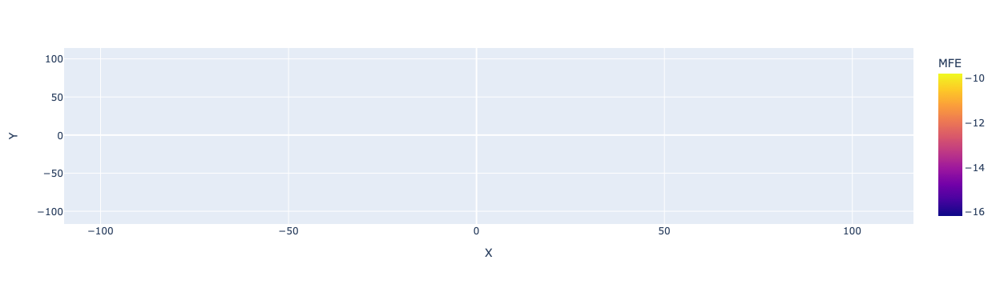

In [79]:
import plotly.express as px
df = df_cp
fig = px.scatter(df_tsne, x='X', y='Y', color = "MFE",
                    custom_data=['RKA', 'sequence'])
                    
#set hover
fig.update_traces(
    hovertemplate = "<br>".join([
    "Seq: %{customdata[1]}",
    "RKA: %{customdata[0]}"])
)
fig.show()

### 2D t-SNE result with association affinity in z axis

In [77]:
import plotly.express as px
df = df_cp
fig = px.scatter_3d(df_tsne, x='X', y='Y', z = "RKA_level", color = 'MFE',
                 custom_data=['RKA', 'sequence'])

fig.update_traces(marker=dict(size=2))

#set hover
fig.update_traces(
    hovertemplate = "<br>".join([
    "Seq: %{customdata[0]}",
    "RKA: %{customdata[1]}",
    "MFE: %{customdata[2]}"])
)

### 3D t-SNE Demo

In [63]:
df_key = df_cp.copy()
df_key = df_key.drop(["Sequence", "Structure", "K", "KA", "Qc", "sevenMer", "MFE", "RKA"], axis = 1)
X_embedded = TSNE(n_components=3, learning_rate='auto', init='random', perplexity=50).fit_transform(df_key)
df_visual = pd.DataFrame(X_embedded)
df_visual.head()

,0,1,2
0,-12.660853,14.479414,3.192742
1,8.044091,-21.748074,12.167948
2,-12.704786,14.428396,2.822864
3,6.789490,-21.257090,13.611884
4,8.484741,6.715196,-24.270124


### Preparation for data visualization

In [74]:
df_visual["RKA"] = df_cp.RKA
df_visual["sequence"] = df.sevenMer
df_visual["RKA_level"] = df_cp.RKA_level
df_visual.columns = ["x", "y", "z", "RKA","sequence", "RKA_level"]
df_visual.head()

,x,y,z,RKA,sequence,RKA_level
0,-12.660853,14.479414,3.192742,0.395847,AAAAAAA,0
1,8.044091,-21.748074,12.167948,0.435934,AAAAAAC,0
2,-12.704786,14.428396,2.822864,0.545273,AAAAAAG,0
3,6.789490,-21.257090,13.611884,0.297831,AAAAAAU,0
4,8.484741,6.715196,-24.270124,0.610919,AAAAACA,0


### Visualize data by 3D scatter plot in plotly

In [75]:
import plotly.express as px
df = df_cp
fig = px.scatter_3d(df_visual, x='x', y='y', z='z', color = "RKA_level", size_max=15,
                    custom_data=['RKA', 'sequence'])
                    
#set hover
fig.update_traces(
    hovertemplate = "<br>".join([
    "Seq: %{customdata[1]}",
    "RKA: %{customdata[0]}"])
)
fig.update_traces(marker=dict(size=2))
fig.show()